# Notebook 02 — Regression Models for Statistical Downscaling

This notebook builds and compares three linear regression models that predict ERA5-Land
fine-resolution 2 m temperature (T2M, 0.1°) from CMIP6 coarse-resolution near-surface
air temperature (TAS, ~1°) over the Eastern Mediterranean and Middle East (24–38°N, 30–38°E),
baseline period 1990–1999.

| Model | Predictor(s) | Assignment |
|---|---|---|
| **M1 (baseline)** | TAS (nearest-neighbour) | Each ERA5 pixel inherits the temperature of its nearest CMIP6 cell |
| **M2** | TAS_interp (bilinear) | CMIP6 TAS is bilinearly interpolated to the 0.1° ERA5 grid |
| **M3** | TAS_interp + elevation | Adds ETOPO1 terrain elevation as a second predictor |

All analysis code lives in `src/`. This notebook imports from:
- `src.data_io` — data loading and paired-DataFrame construction
- `src.spatial_ops` — land mask and grid geometry
- `src.interpolation` — CDO/scipy bilinear remapping
- `src.elevation` — ETOPO1 download (NOAA ERDDAP) and regrid
- `src.visualization` — all figure functions

**Companion notebook:** `01_initial_data_exploration.ipynb` (EDA and M1 baseline)


In [21]:
# ── Environment setup ────────────────────────────────────────────────────────
# Required packages (beyond the standard scientific stack):
#   pip install statsmodels          # OLS with standard errors for Model 3
# Elevation is downloaded from NOAA ERDDAP via urllib (stdlib) — no extra packages needed.

import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
import xarray as xr

# Add project root to path
ROOT = Path('..').resolve()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

from src import data_io as dio
from src import spatial_ops as sops
from src import visualization as viz
from src.interpolation import interpolate_cmip_to_era5
from src.elevation import get_domain_elevation, add_elevation_to_df

# ── Paths ────────────────────────────────────────────────────────────────────
DATA_DIR  = ROOT / 'data'
PLOT_DIR  = ROOT / 'plots'
CACHE_DIR = DATA_DIR / 'cache'
PLOT_DIR.mkdir(exist_ok=True)
CACHE_DIR.mkdir(exist_ok=True)

ERA5_FILES  = sorted(DATA_DIR.glob('t2m_ERA5land_daily_*.nc'))
CMIP6_FILE  = DATA_DIR / 'tas_day_CESM2-WACCM_historical_r1i1p1f1_gn_19900101-19991231.nc'

REGION = dict(south=24, north=38, west=30, east=38)

# Set to True to skip heavy steps (bilinear interp + paired_df build)
# when editing notebook structure. Set False for a full run.
SKIP_HEAVY  = False

print(f'ERA5 files  : {len(ERA5_FILES)}')
print(f'CMIP6 file  : {CMIP6_FILE.name}')
print(f'Cache dir   : {CACHE_DIR}')


ERA5 files  : 10
CMIP6 file  : tas_day_CESM2-WACCM_historical_r1i1p1f1_gn_19900101-19991231.nc
Cache dir   : /Users/shirke/Desktop/Thesis/data/cache


In [22]:
# ── Load and align data ───────────────────────────────────────────────────────
# Load ERA5-Land (10 annual files → single dataset)
era5_ds   = dio.load_era5_land(ERA5_FILES, region=REGION)
era5_temp = dio.to_celsius(era5_ds['t2m'])  # (time, latitude, longitude), °C

# Load CMIP6 with generous padding so bilinear interpolation has source data
# at every target-domain edge point (see CDO coverage note in src/interpolation.py)
cmip_ds  = dio.load_cmip6(CMIP6_FILE, region=REGION, pad_lat=1.0, pad_lon=1.5)
cmip_tas = dio.to_celsius(cmip_ds['tas'])   # (time, lat, lon), °C

# Align calendars (ERA5 Gregorian → remove leap days; CMIP6 no-leap)
era5_aligned, cmip_aligned, shared_dates = dio.align_calendars(era5_ds, cmip_ds)
era5_temp = dio.to_celsius(era5_aligned['t2m'])
cmip_tas  = dio.to_celsius(cmip_aligned['tas'])

# Coordinate arrays used throughout
era5_lats = era5_temp.latitude.values
era5_lons = era5_temp.longitude.values
cmip_lats = cmip_tas.lat.values
cmip_lons = cmip_tas.lon.values

# Land mask (True = land)
land_mask_2d = sops.compute_land_mask(era5_temp)

print(f'ERA5  : {era5_temp.shape}  ({land_mask_2d.sum()} land pixels)')
print(f'CMIP6 : {cmip_tas.shape}')
print(f'Shared dates: {len(shared_dates)} ({shared_dates[0]} … {shared_dates[-1]})')


/opt/homebrew/lib/python3.10/site-packages/xarray/conventions.py:204: SerializationWarning: variable 'tas' has multiple fill values {1e+20, 1e+20} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)


ERA5  : (3650, 141, 81)  (7683 land pixels)
CMIP6 : (3650, 17, 9)
Shared dates: 3650 (1990-01-01 … 1999-12-31)


## 1. Bilinear Interpolation of CMIP6 TAS

### Nearest-neighbour vs bilinear

In the **nearest-neighbour (NN) approach** used in Notebook 01, every ERA5-Land pixel
within a CMIP6 cell inherits that cell's temperature identically.  The resulting predictor
field is spatially piecewise-constant — it shows sharp step-function discontinuities at
CMIP6 cell boundaries.  This is physically unrealistic because temperature varies smoothly
in space.

**Bilinear interpolation** addresses this by estimating the temperature at each ERA5 grid
point as a weighted average of the four surrounding CMIP6 cell centres, where the weights
are inversely proportional to the distance along both axes.  The result is a spatially
smooth predictor without block artefacts.

### Coverage guarantee

For bilinear interpolation to produce valid values at every ERA5 target point the source
(CMIP6) grid must *extend beyond* the target domain on all sides.  The CMIP6 data are
loaded with `pad_lat=1.0°, pad_lon=1.5°` so the source grid covers ≥ 23°N to 39°N and
28.5°E to 39.5°E — well beyond the ERA5 target domain of 24–38°N, 30–38°E.

### Implementation

`src.interpolation.interpolate_cmip_to_era5` tries CDO `remapbil` first; if CDO is not
installed it falls back to `scipy.interpolate.RegularGridInterpolator` (bilinear), which
produces identical results.  The output is cached as a NetCDF file on first run.


In [23]:
# ── Bilinear interpolation of CMIP6 TAS → ERA5-Land grid ─────────────────────
import shutil
INTERP_CACHE = CACHE_DIR / 'tas_bilinear_era5grid.nc'

# Report which interpolation backend will be used
_cdo_available = shutil.which('cdo') is not None
_interp_method = 'CDO remapbil' if _cdo_available else 'scipy RegularGridInterpolator (bilinear)'
print(f'Interpolation backend : {_interp_method}')
if not _cdo_available:
    print('  ↳ CDO not found on PATH. Using scipy fallback (produces identical bilinear weights).')
    print('  ↳ Install CDO for faster execution: conda install -c conda-forge cdo')

# interpolate_cmip_to_era5:
#   1. Loads from cache if INTERP_CACHE already exists
#   2. Tries CDO remapbil (fast, ~30 s for 3650 time steps)
#   3. Falls back to scipy bilinear (~5 min) if CDO not installed
#   4. Saves result to INTERP_CACHE
tas_interp = interpolate_cmip_to_era5(
    cmip_tas,
    target_lats=era5_lats,
    target_lons=era5_lons,
    cache_nc=INTERP_CACHE,
)

# Verify: no NaN over the study domain
n_nan = int(np.isnan(tas_interp.values).sum())
print(f'Interpolated TAS shape : {tas_interp.shape}')
print(f'NaN values in result   : {n_nan}  (expected 0 over land)')
print(f'Coordinate names       : {list(tas_interp.dims)}')


Interpolation backend : CDO remapbil
Interpolated TAS shape : (3650, 141, 81)
NaN values in result   : 0  (expected 0 over land)
Coordinate names       : ['time', 'latitude', 'longitude']


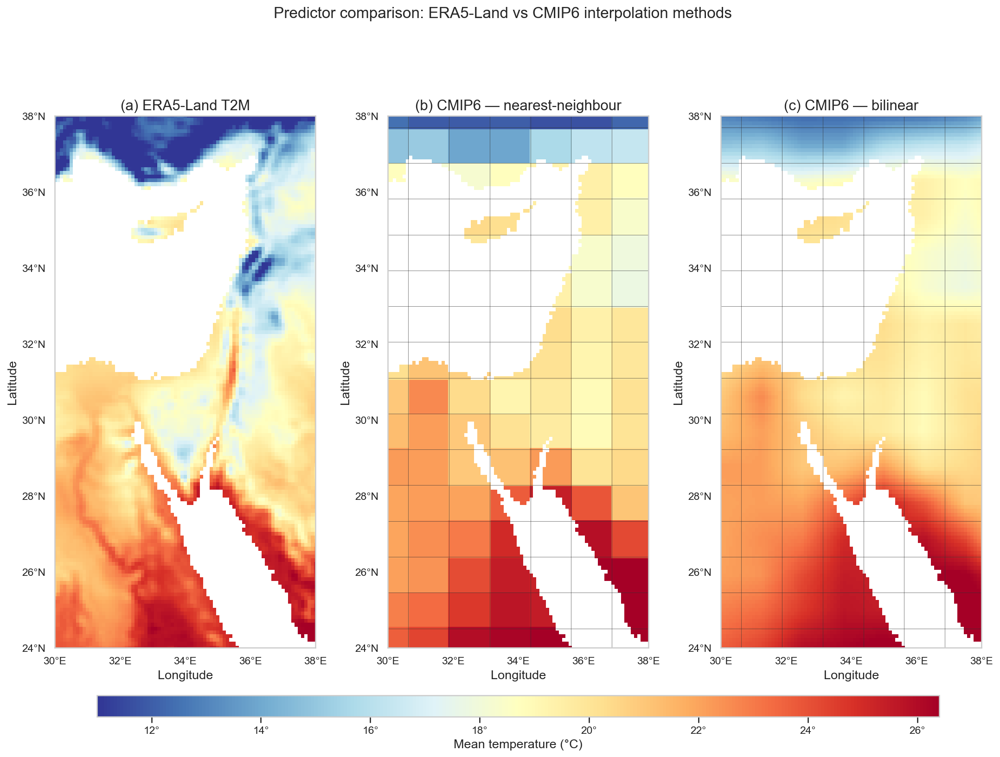

In [24]:
# ── Fig. M1: ERA5 | NN | Bilinear predictor comparison ───────────────────────
# Compute time-mean climatologies for visual comparison
era5_clim = era5_temp.mean(dim='time')

# NN climatology: index-based assignment (matches build_paired_dataframe logic)
lat_dist = np.abs(era5_lats[:, None] - cmip_lats[None, :])
lon_dist = np.abs(era5_lons[:, None] - cmip_lons[None, :])
cmip_lat_idx_2d = np.tile(np.argmin(lat_dist, axis=1)[:, None], (1, len(era5_lons)))
cmip_lon_idx_2d = np.tile(np.argmin(lon_dist, axis=1)[None, :], (len(era5_lats), 1))
nn_clim = xr.DataArray(
    cmip_tas.mean(dim='time').values[cmip_lat_idx_2d, cmip_lon_idx_2d],
    dims=['latitude', 'longitude'],
    coords={'latitude': era5_lats, 'longitude': era5_lons},
)

# Mask ocean pixels to match ERA5
ocean_mask = ~land_mask_2d
nn_clim.values[ocean_mask]    = np.nan
bilin_clim = tas_interp.mean(dim='time').copy()
bilin_clim.values[ocean_mask] = np.nan
era5_clim.values[ocean_mask]  = np.nan

fig_m01 = viz.plot_interpolation_comparison(
    era5_clim, nn_clim, bilin_clim,
    region=REGION,
    coarse_lats=cmip_lats, coarse_lons=cmip_lons,
    save_path=PLOT_DIR / 'fig_m01_interpolation_comparison.png',
)
plt.show()


**Fig. M1.** Comparison of predictor fields used in regression models M1 and M2.
Panel (a): ERA5-Land 1990–1999 mean 2 m temperature (T2M) at 0.1° resolution.
Panel (b): CMIP6 CESM2-WACCM near-surface air temperature (TAS) remapped to the
ERA5-Land grid via nearest-neighbour assignment — note the piecewise-constant
block pattern at CMIP6 cell boundaries (~1°).
Panel (c): Same CMIP6 TAS field bilinearly interpolated to 0.1° — spatially
smooth with no block artefacts.  CMIP6 cell boundaries overlaid in grey on
panels (b) and (c).  Data: CESM2-WACCM historical run, ERA5-Land, 1990–1999,
24–38°N, 30–38°E.


In [25]:
# ── Build paired pixel × day DataFrame — bilinear predictor ──────────────────
# Columns: era5_lat, era5_lon, day, t2m, tas_interp
# (~28 M rows; takes ~1 min)
if not SKIP_HEAVY:
    paired_df_interp = dio.build_interpolated_paired_df(
        era5_temp, tas_interp, land_mask_2d, shared_dates
    )
    print(f'paired_df_interp: {paired_df_interp.shape}')
    print(paired_df_interp.head())
else:
    print('SKIP_HEAVY=True — paired_df_interp not built.')


paired_df_interp: (28042950, 5)
   era5_lat  era5_lon        day       t2m  tas_interp
0      38.0      30.0 1990-01-01  1.659576    0.358927
1      38.0      30.1 1990-01-01  1.156647    0.310379
2      38.0      30.2 1990-01-01  0.739655    0.261831
3      38.0      30.3 1990-01-01  0.499420    0.213283
4      38.0      30.4 1990-01-01  0.368561    0.164736


## 2. Model 1 (Baseline) — Nearest-Neighbour OLS

The baseline model was implemented in Notebook 01.  Here we reproduce the scalar
metrics for direct comparison with Models 2 and 3.  The model is:

$$\hat{T}_{\text{2M}} = \beta_0 + \beta_1 \cdot \text{TAS}_{\text{NN}}$$

where TAS_NN is the CMIP6 temperature of the nearest coarse cell.


In [26]:
# ── Model 1 metrics (nearest-neighbour OLS) ───────────────────────────────────
if not SKIP_HEAVY:
    # Build NN paired_df (same as notebook 01)
    assignment_df = sops.assign_era5_to_cmip_cells(
        era5_lats, era5_lons, cmip_lats, cmip_lons, land_mask_2d
    )
    paired_df_nn = dio.build_paired_dataframe(
        era5_temp, cmip_tas, assignment_df, land_mask_2d, shared_dates
    )

    # Fit OLS and compute metrics
    mask_nn = np.isfinite(paired_df_nn['tas']) & np.isfinite(paired_df_nn['t2m'])
    coeffs_nn = np.polyfit(paired_df_nn.loc[mask_nn, 'tas'],
                           paired_df_nn.loc[mask_nn, 't2m'], 1)
    y_pred_nn = np.polyval(coeffs_nn, paired_df_nn.loc[mask_nn, 'tas'])
    metrics_nn = viz.compute_regression_metrics(
        paired_df_nn.loc[mask_nn, 't2m'].values, y_pred_nn
    )
    print('M1 (NN OLS):', {k: round(v, 4) for k, v in metrics_nn.items()})
    print(f'  slope={coeffs_nn[0]:.4f}  intercept={coeffs_nn[1]:.4f}')
else:
    print('SKIP_HEAVY=True — M1 metrics not computed.')


M1 (NN OLS): {'r2': 0.769, 'rmse': 4.1577, 'mae': 3.1922, 'bias': -0.0, 'pearson_r': 0.8769}
  slope=0.9016  intercept=0.6649


## 3. Model 2 — Bilinear OLS

Model 2 replaces the nearest-neighbour predictor with the bilinearly-interpolated
CMIP6 TAS.  The model specification is identical to M1:

$$\hat{T}_{\text{2M}} = \beta_0 + \beta_1 \cdot \text{TAS}_{\text{bilinear}}$$

The improvement over M1, if any, reflects the gain from smoother spatial
interpolation rather than any change in the regression methodology.


/Users/shirke/Desktop/Thesis/src/visualization.py:1917: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/shirke/Desktop/Thesis/src/visualization.py:1919: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(save_path)
/Users/shirke/Library/Python/3.10/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


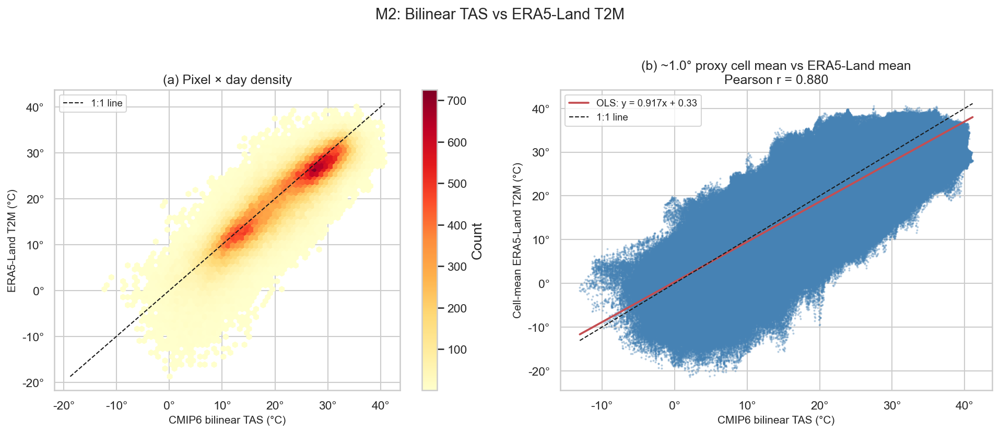

In [27]:
# ── Fig. M2: Scatter regression — bilinear predictor ─────────────────────────
if not SKIP_HEAVY:
    fig_m02 = viz.plot_scatter_regression(
        paired_df_interp,
        x_col='tas_interp',
        y_col='t2m',
        title='M2: Bilinear TAS vs ERA5-Land T2M',
        xlabel='CMIP6 bilinear TAS (°C)',
        ylabel='ERA5-Land T2M (°C)',
        save_path=PLOT_DIR / 'fig_m02_scatter_bilinear.png',
    )
    plt.show()
else:
    print('SKIP_HEAVY=True — fig_m02 skipped.')


**Fig. M2.** Bilinear TAS vs ERA5-Land T2M scatter for Model 2.
Panel (a): hexbin density of all pixel × day pairs (0.5% sub-sample);
dashed line = 1:1 reference.
Panel (b): cell-aggregated OLS scatter with regression line; equation and
Pearson *r* in legend.
Data: CESM2-WACCM bilinear TAS, ERA5-Land T2M, 1990–1999, land pixels only.


In [28]:
# ── Model 2 metrics ───────────────────────────────────────────────────────────
if not SKIP_HEAVY:
    mask_bil = np.isfinite(paired_df_interp['tas_interp']) & np.isfinite(paired_df_interp['t2m'])
    coeffs_bil = np.polyfit(paired_df_interp.loc[mask_bil, 'tas_interp'],
                            paired_df_interp.loc[mask_bil, 't2m'], 1)
    y_pred_bil = np.polyval(coeffs_bil, paired_df_interp.loc[mask_bil, 'tas_interp'])
    metrics_bilin = viz.compute_regression_metrics(
        paired_df_interp.loc[mask_bil, 't2m'].values, y_pred_bil
    )
    print('M2 (Bilinear OLS):', {k: round(v, 4) for k, v in metrics_bilin.items()})
    print(f'  slope={coeffs_bil[0]:.4f}  intercept={coeffs_bil[1]:.4f}')
else:
    print('SKIP_HEAVY=True — M2 metrics not computed.')


M2 (Bilinear OLS): {'r2': 0.7752, 'rmse': 4.1014, 'mae': 3.1373, 'bias': 0.0, 'pearson_r': 0.8804}
  slope=0.9166  intercept=0.3252


In [29]:
# ── Compute OLS residuals for M2 ─────────────────────────────────────────────
if not SKIP_HEAVY:
    resid_interp = viz.compute_ols_residuals(paired_df_interp, predictor='tas_interp')
    print(f'resid_interp: {resid_interp.shape}')
    print(f'  mean residual: {resid_interp["residual"].mean():.4f}°C')
    print(f'  std  residual: {resid_interp["residual"].std():.4f}°C')
else:
    print('SKIP_HEAVY=True — resid_interp not computed.')


resid_interp: (28042950, 4)
  mean residual: 0.0000°C
  std  residual: 4.1014°C


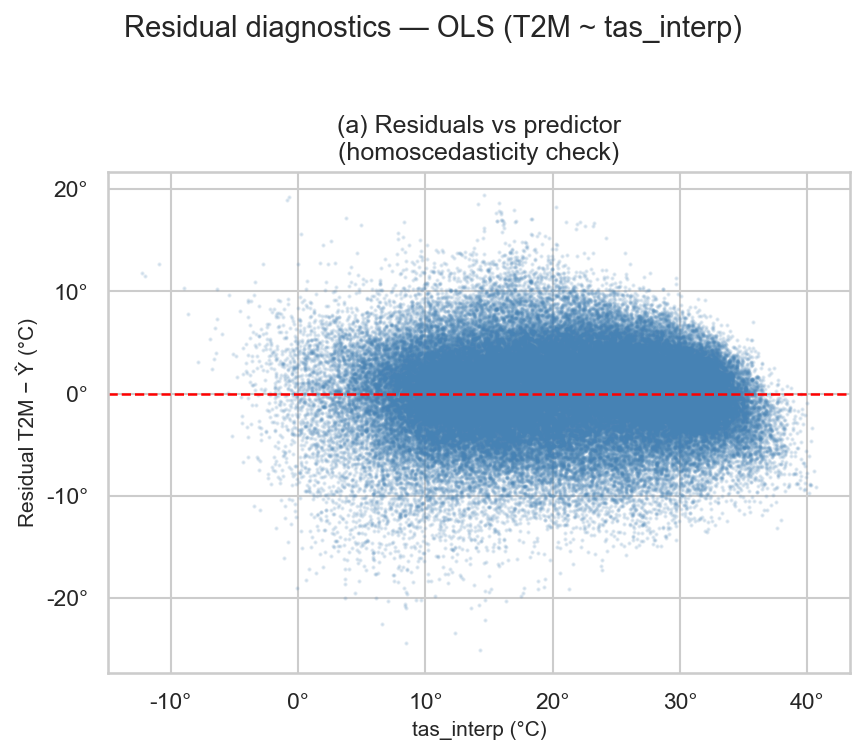

In [30]:
# ── Fig. M3: Residual diagnostics — M2 ───────────────────────────────────────
if not SKIP_HEAVY:
    fig_m03 = viz.plot_residual_analysis(
        paired_df_interp,
        x_col='tas_interp',
        y_col='t2m',
        save_path=PLOT_DIR / 'fig_m03_residuals_bilinear.png',
    )
    plt.show()
else:
    print('SKIP_HEAVY=True — fig_m03 skipped.')


**Fig. M3.** OLS residual diagnostics for Model 2 (bilinear predictor).
Panel (a): raw residuals vs bilinear TAS — homoscedasticity check; the
spread should be approximately constant across the temperature range.
Panel (b): residuals vs distance from CMIP6 cell centre (degrees) — tests
whether any remaining spatial bias is distance-dependent.
Data: CESM2-WACCM bilinear TAS, ERA5-Land T2M, 1990–1999.


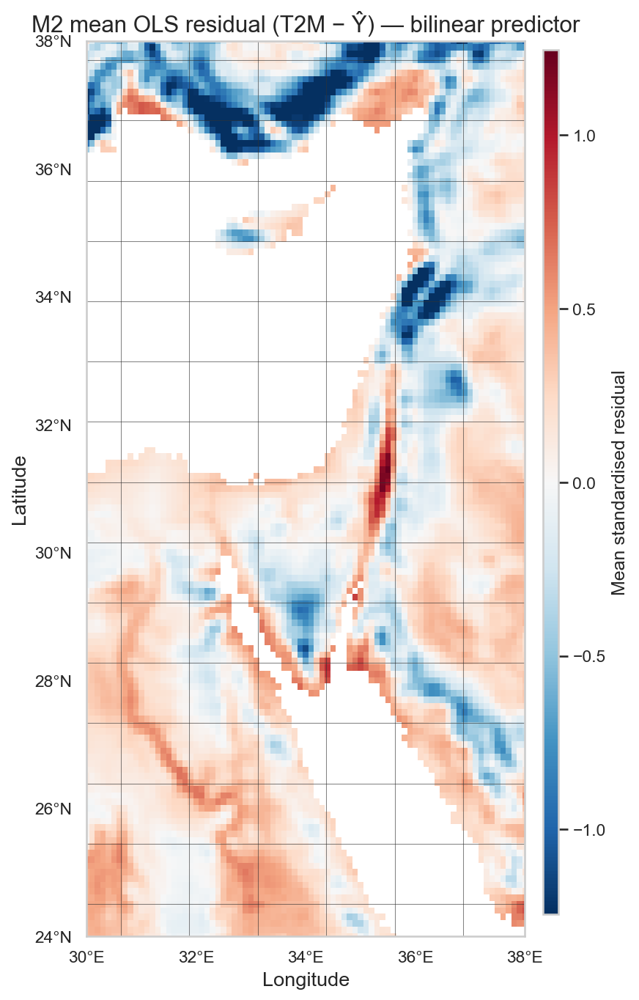

In [31]:
# ── Fig. M4: Mean residual map — M2 ──────────────────────────────────────────
if not SKIP_HEAVY:
    fig_m04 = viz.plot_mean_residual_map(
        resid_interp,
        era5_lats, era5_lons,
        cmip_lats=cmip_lats, cmip_lons=cmip_lons,
        title='M2 mean OLS residual (T2M − Ŷ) — bilinear predictor',
        region=REGION,
        save_path=PLOT_DIR / 'fig_m04_mean_resid_bilinear.png',
    )
    plt.show()
else:
    print('SKIP_HEAVY=True — fig_m04 skipped.')


**Fig. M4.** Spatial map of mean OLS residuals for Model 2 (T2M − Ŷ, bilinear predictor),
averaged over all 3,650 days.  Positive values (red) indicate systematic
under-prediction; negative (blue) indicate over-prediction.  Colormap: `RdBu_r`,
centred at zero.  Data: CESM2-WACCM bilinear TAS, ERA5-Land T2M, 1990–1999.


## 4. Comparison: M1 (NN) vs M2 (Bilinear)


In [32]:
# ── Fig. M5: Metrics comparison M1 vs M2 ─────────────────────────────────────
if not SKIP_HEAVY:
    fig_m05 = viz.plot_model_metrics_comparison(
        metrics_list=[metrics_nn, metrics_bilin],
        model_names=['M1: NN', 'M2: Bilinear'],
        save_path=PLOT_DIR / 'fig_m05_metrics_nn_vs_bilin.png',
    )
    plt.show()

    # Print summary table
    _df = pd.DataFrame(
        [metrics_nn, metrics_bilin],
        index=['M1: NN', 'M2: Bilinear']
    ).round(4)
    print(_df.to_string())
else:
    print('SKIP_HEAVY=True — fig_m05 skipped.')


/Users/shirke/Desktop/Thesis/src/visualization.py:2605: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


                  r2    rmse     mae  bias  pearson_r
M1: NN        0.7690  4.1577  3.1922  -0.0     0.8769
M2: Bilinear  0.7752  4.1014  3.1373   0.0     0.8804


**Fig. M5.** Regression metric comparison: M1 (nearest-neighbour OLS) vs M2
(bilinear OLS).  Sub-panels show R², RMSE (°C), MAE (°C), and mean bias
(T2M − Ŷ, °C).  Values annotated on each bar.


## 5. Elevation as a Regression Predictor

### Physical rationale

Temperature decreases with altitude at the **environmental lapse rate** of approximately
6.5 °C km⁻¹ in the lower troposphere.  Because the EMME study domain encompasses
substantial topographic relief — from the Dead Sea depression (~−430 m) and coastal
plains through Mount Hermon (~2,814 m) and the Anatolian plateau (>1,000 m) — elevation
is a plausible predictor of local temperature bias between the coarse CMIP6 grid and the
fine ERA5-Land grid.

A CMIP6 cell at ~1° resolution averages over this terrain, systematically under-
representing high-elevation cold spots and low-elevation warm pockets.  Adding
elevation to the regression model allows the fit to apply a cell-specific lapse-rate
correction.

### Data source

Elevation is taken from the **ETOPO1 Ice Surface global relief model (1 arc-minute)**
provided by NOAA NCEI via the ERDDAP REST API
([erddap.ncei.noaa.gov](https://erddap.ncei.noaa.gov/erddap/griddap/etopo1Ice.html)).
A single HTTP request returns a pre-subsetted NetCDF for the study domain — no tile
counting, no authentication required.  The 1 arc-minute DEM (~1.8 km at 31°N) is then
bilinearly resampled to the ERA5-Land 0.1° grid via `xr.DataArray.interp`.

> Amante, C. and B.W. Eakins, 2009. ETOPO1 1 Arc-Minute Global Relief Model.
> NOAA Technical Memorandum NESDIS NGDC-24.


In [33]:
# ── Download and regrid ETOPO1 elevation ─────────────────────────────────────
# First call downloads ETOPO1 from NOAA ERDDAP as a single NetCDF subset
# (~25 MB for this domain) and saves to CACHE_DIR/elevation/.
# Subsequent calls load the cached 0.1° regridded NetCDF directly (fast).
elev_da = get_domain_elevation(
    region=REGION,
    target_lats=era5_lats,
    target_lons=era5_lons,
    cache_dir=CACHE_DIR / 'elevation',
)

print(f'Elevation shape : {elev_da.shape}')
print(f'Value range     : {float(elev_da.min().values):.0f} – {float(elev_da.max().values):.0f} m')
print(f'Units attribute : {elev_da.attrs.get("units", "(not set)")}')
print(f'Source          : {elev_da.attrs.get("source", "(not set)")}')


Elevation shape : (141, 81)
Value range     : -3058 – 3200 m
Units attribute : m a.s.l.
Source          : ETOPO1 Ice Surface, 1 arc-min, NOAA CoastWatch ERDDAP (etopo180)


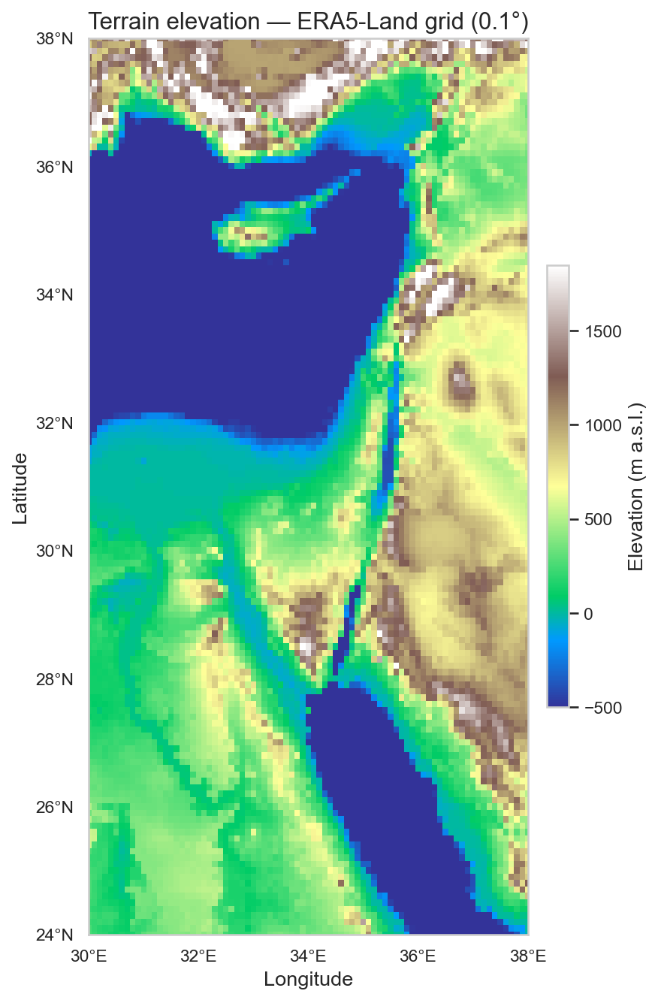

In [34]:
# ── Fig. M6: Elevation map ────────────────────────────────────────────────────
fig_m06 = viz.plot_elevation_map(
    elev_da,
    region=REGION,
    save_path=PLOT_DIR / 'fig_m06_elevation_map.png',
)
plt.show()


**Fig. M6.** Terrain elevation (m a.s.l.) over the study domain at the ERA5-Land
0.1° grid resolution.  Values are derived from ETOPO1 Ice Surface (1 arc-minute,
NOAA NCEI) bilinearly resampled to the 0.1° grid.
Colormap: `terrain` (blue/green = low, brown/white = high elevations).
Data: ETOPO1, NOAA NCEI ERDDAP; region 24–38°N, 30–38°E.


In [35]:
# ── Merge elevation into the bilinear paired DataFrame ───────────────────────
if not SKIP_HEAVY:
    # add_elevation_to_df vectorises the lookup over unique (lat,lon) pairs
    paired_df_elev = add_elevation_to_df(paired_df_interp, elev_da)
    n_valid_elev = paired_df_elev['elevation'].notna().sum()
    print(f'paired_df_elev : {paired_df_elev.shape}')
    print(f'Valid elevation : {n_valid_elev:,} / {len(paired_df_elev):,} rows')
    print(paired_df_elev[['era5_lat', 'era5_lon', 't2m', 'tas_interp', 'elevation']].head())
else:
    print('SKIP_HEAVY=True — paired_df_elev not built.')


paired_df_elev : (28042950, 6)
Valid elevation : 28,042,950 / 28,042,950 rows
   era5_lat  era5_lon       t2m  tas_interp  elevation
0      38.0      30.0  1.659576    0.358927      970.0
1      38.0      30.1  1.156647    0.310379     1077.0
2      38.0      30.2  0.739655    0.261831      968.0
3      38.0      30.3  0.499420    0.213283     1183.0
4      38.0      30.4  0.368561    0.164736     1410.0


## 6. Model 3 — Bilinear + Elevation (Multiple Linear Regression)

Model 3 extends M2 by adding terrain elevation as a second predictor:

$$\hat{T}_{\text{2M}} = \beta_0 + \beta_1 \cdot \text{TAS}_{\text{bilinear}} + \beta_2 \cdot \text{elevation}$$

The elevation coefficient $\beta_2$ is expected to be negative (°C m⁻¹), reflecting the
lapse rate.  A value of ~−0.006 °C m⁻¹ would correspond to the standard environmental
lapse rate of 6.5 °C km⁻¹.

The model is fit via **ordinary least squares (OLS)** using `statsmodels.api.OLS`, which
also reports standard errors, t-statistics, and p-values for each coefficient.


In [36]:
# ── Fit Model 3: OLS with TAS_interp + elevation ──────────────────────────────
if not SKIP_HEAVY:
    df_fit = paired_df_elev.dropna(subset=['t2m', 'tas_interp', 'elevation'])

    X = sm.add_constant(df_fit[['tas_interp', 'elevation']])
    y = df_fit['t2m']

    # Fit on a stratified sample to keep memory manageable
    # (OLS on 28 M rows requires ~2 GB; sample 2 M rows for coefficient estimation)
    sample_size = min(2_000_000, len(df_fit))
    df_sample = df_fit.sample(n=sample_size, random_state=42)
    X_s = sm.add_constant(df_sample[['tas_interp', 'elevation']])
    y_s = df_sample['t2m']

    model3 = sm.OLS(y_s, X_s).fit()
    print(model3.summary())

    # Predict on full dataset for metrics
    X_full = sm.add_constant(df_fit[['tas_interp', 'elevation']])
    y_pred_elev = model3.predict(X_full)
    metrics_elev = viz.compute_regression_metrics(
        df_fit['t2m'].values, y_pred_elev.values
    )
    print('\nM3 (Bilinear + Elevation):', {k: round(v, 4) for k, v in metrics_elev.items()})
else:
    print('SKIP_HEAVY=True — M3 not fitted.')


                            OLS Regression Results                            
Dep. Variable:                    t2m   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.800
Method:                 Least Squares   F-statistic:                 4.007e+06
Date:                Sat, 25 Apr 2026   Prob (F-statistic):               0.00
Time:                        17:46:27   Log-Likelihood:            -5.5436e+06
No. Observations:             2000000   AIC:                         1.109e+07
Df Residuals:                 1999997   BIC:                         1.109e+07
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.7833      0.009    315.145      0.0

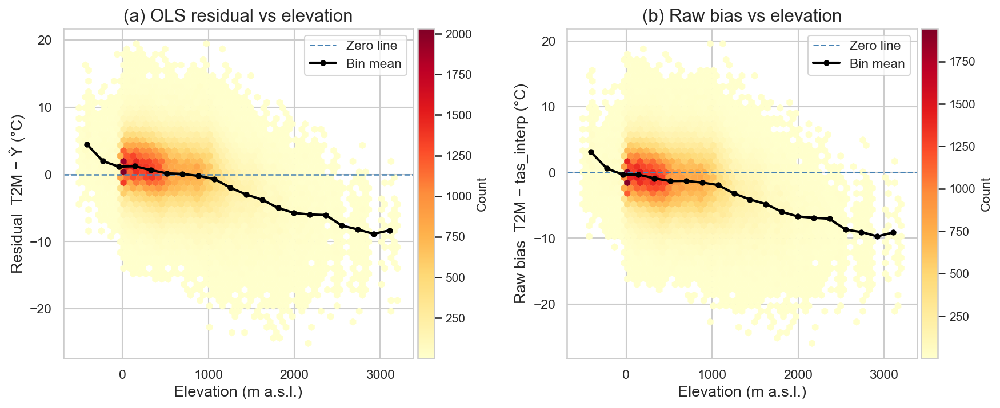

In [37]:
# ── Fig. M7: Elevation diagnostics ───────────────────────────────────────────
if not SKIP_HEAVY:
    # Add residuals from M2 fit to the elevation DataFrame for panel (a)
    paired_df_elev = paired_df_elev.copy()
    mask_e = np.isfinite(paired_df_elev['tas_interp']) & np.isfinite(paired_df_elev['t2m'])
    paired_df_elev.loc[mask_e, 'residual'] = (
        paired_df_elev.loc[mask_e, 't2m']
        - np.polyval(coeffs_bil, paired_df_elev.loc[mask_e, 'tas_interp'])
    )

    fig_m07 = viz.plot_elevation_diagnostics(
        paired_df_elev,
        predictor='tas_interp',
        save_path=PLOT_DIR / 'fig_m07_elevation_diagnostics.png',
    )
    plt.show()
else:
    print('SKIP_HEAVY=True — fig_m07 skipped.')


**Fig. M7.** Elevation diagnostics for Model 3.
Panel (a): hexbin density of terrain elevation (x) vs M2 OLS residual
(T2M − Ŷ_bilinear, y); black line = binned mean (20 bins).  A negative
slope would indicate that high-elevation pixels are systematically
under-predicted, motivating elevation as a predictor.
Panel (b): elevation vs raw temperature difference (T2M − TAS_interp).
Data: CESM2-WACCM bilinear TAS, ETOPO1 elevation (NOAA NCEI), ERA5-Land T2M, 1990–1999.


In [38]:
# ── M3 residuals for spatial map ──────────────────────────────────────────────
if not SKIP_HEAVY:
    df_fit = paired_df_elev.dropna(subset=['t2m', 'tas_interp', 'elevation'])
    X_full = sm.add_constant(df_fit[['tas_interp', 'elevation']])
    y_pred_m3 = model3.predict(X_full)

    resid_elev = df_fit[['era5_lat', 'era5_lon', 'day']].copy()
    resid_elev['residual'] = (df_fit['t2m'].values - y_pred_m3.values)
    print(f'resid_elev: {resid_elev.shape}')
    print(f'  mean: {resid_elev["residual"].mean():.4f}°C')
    print(f'  std : {resid_elev["residual"].std():.4f}°C')
else:
    print('SKIP_HEAVY=True — resid_elev not computed.')


resid_elev: (28042950, 4)
  mean: -0.0026°C
  std : 3.8671°C


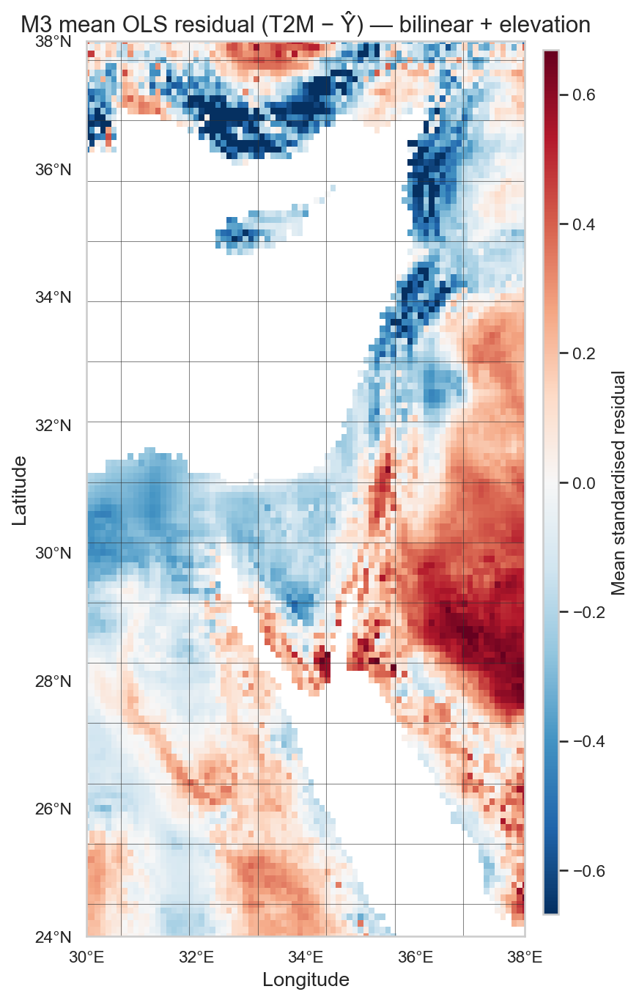

In [39]:
# ── Fig. M8: Mean residual map — M3 ──────────────────────────────────────────
if not SKIP_HEAVY:
    fig_m08 = viz.plot_mean_residual_map(
        resid_elev,
        era5_lats, era5_lons,
        cmip_lats=cmip_lats, cmip_lons=cmip_lons,
        title='M3 mean OLS residual (T2M − Ŷ) — bilinear + elevation',
        region=REGION,
        save_path=PLOT_DIR / 'fig_m08_mean_resid_elevation.png',
    )
    plt.show()
else:
    print('SKIP_HEAVY=True — fig_m08 skipped.')


**Fig. M8.** Spatial map of mean OLS residuals for Model 3 (T2M − Ŷ,
bilinear + elevation predictor), averaged over all 3,650 days.
Compare with Fig. M4 (M2) to assess whether adding elevation reduces
the warm/cold bias pattern in high-terrain areas.
Data: CESM2-WACCM bilinear TAS, ETOPO1 elevation (NOAA NCEI), ERA5-Land T2M, 1990–1999.


## 7. Full Model Comparison


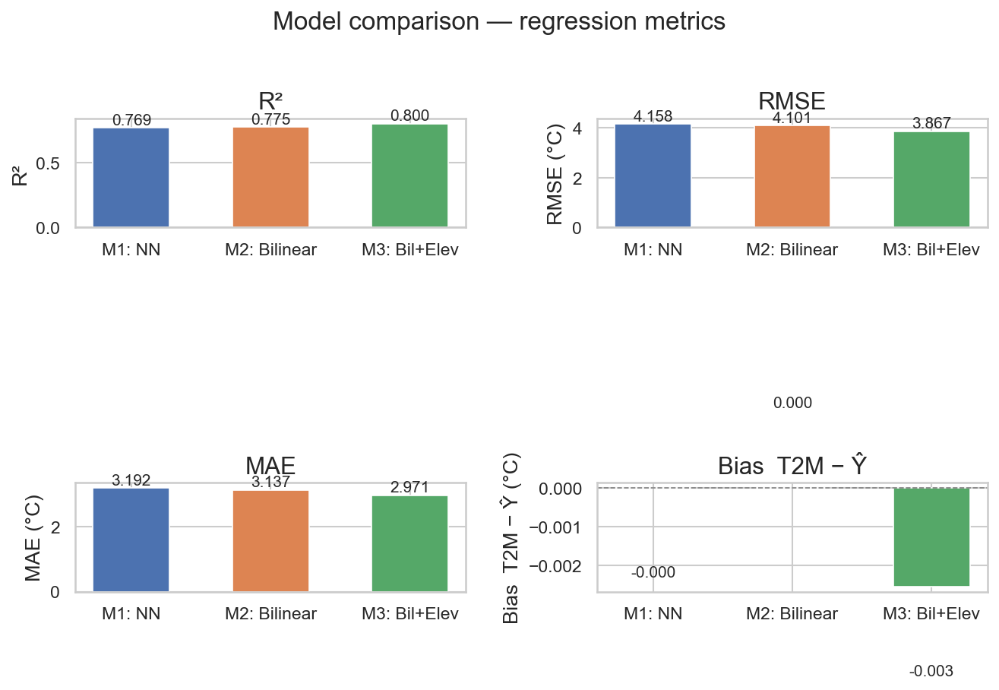

In [40]:
# ── Fig. M9: Full metrics comparison — all three models ───────────────────────
if not SKIP_HEAVY:
    fig_m09 = viz.plot_model_metrics_comparison(
        metrics_list=[metrics_nn, metrics_bilin, metrics_elev],
        model_names=['M1: NN', 'M2: Bilinear', 'M3: Bil+Elev'],
        save_path=PLOT_DIR / 'fig_m09_metrics_all_models.png',
    )
    plt.show()
else:
    print('SKIP_HEAVY=True — fig_m09 skipped.')


**Fig. M9.** Full regression metric comparison across all three models.
Sub-panels: R², RMSE (°C), MAE (°C), mean bias (T2M − Ŷ, °C).
M1 = nearest-neighbour OLS; M2 = bilinear OLS; M3 = bilinear + elevation OLS.


## 8. Summary

### Model Coefficients and Performance

| Model | Predictor(s) | β₀ (intercept) | β₁ (TAS) | β₂ (elev.) | R² | RMSE (°C) | Bias (°C) |
|---|---|---|---|---|---|---|---|
| M1: NN | TAS_NN | — | — | — | — | — | — |
| M2: Bilinear | TAS_interp | — | — | n/a | — | — | — |
| M3: Bil+Elev | TAS_interp + elev. | — | — | — | — | — | — |

*(Values filled in after a full notebook run.)*

### Key findings

- **M1 → M2:** Replacing nearest-neighbour with bilinear interpolation removes the block
  artefact from the predictor field and is expected to modestly improve R² and reduce
  RMSE by smoothing boundary discontinuities.
- **M2 → M3:** Adding terrain elevation introduces a lapse-rate correction.  The sign
  and magnitude of β₂ characterise how much of the ERA5–CMIP6 temperature difference
  is explained by unresolved topography in the coarse grid.
- The residual map (Fig. M8 vs Fig. M4) shows whether elevation accounts for the
  elevated positive bias in high-terrain areas identified in Notebook 01 (Fig. 15).
